<h1> FACE RECOGNITION SYSTEM

![Screenshot%20%284399%29.png](attachment:Screenshot%20%284399%29.png)

<h1>1.Business/Real-world Problem</h1>

<h2> 1.1. Problem Statement </h2>

- One of the major advantages of facial recognition technology is safety and security. In cities where police don't have time to help fight petty crime, business owners are installing facial-recognition systems to watch people and identify subjects of interest when they come in their stores.

- The applications of Face recognition is in many fields and the necessity to develop a security system where lots of image data of individual persons might not be available as needed in typical CNN's.

- In this we will develop a face recognition system with little image data per person 

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from skimage import transform

from numpy import savez_compressed 
from sklearn.svm import SVC
from sklearn.manifold import TSNE

from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, Normalizer
# import mtcnn
import keras.backend as k
from keras.regularizers import l1, l2
from PIL import Image
from keras.callbacks import ModelCheckpoint
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score
from sklearn.metrics import accuracy_score
from keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle
import mtcnn
from sklearn.model_selection import train_test_split

from keras.models import Model, Sequential, load_model
from keras.preprocessing.image import img_to_array, array_to_img, load_img

# os.chdir('/content/drive/My Drive/case study - 2')
from impt import utility
import pickle
os.getcwd()

Using TensorFlow backend.


'C:\\Users\\user\\Untitled Folder\\case study - 2'

### MODULE - 1 

### 1. FACE DETECTION:

- <b>1.1  VIOLA JONES ALGORITHM :
    

#### 1.2 Program to detect face using webcam and store the cpatured image

In [2]:
path_haar = os.getcwd()+ '/haarcascade/haarcascade_frontalface_default.xml'
face_cascade = cv2.CascadeClassifier(path_haar)

In [ ]:
# #it catptures images and stores them in subdata folder
sub_data = "nikhil"

nik_path = os.path.join(os.getcwd(), sub_data)

if not os.path.isdir(nik_path):
    os.mkdir(nik_path)
    
# defining the size of images  
(width, height) = (160, 160)

#'0' is used for my webcam,  
# if you've any other camera 
#  attached use '1' like this 
face_cascade = cv2.CascadeClassifier(path_haar) 
webcam = cv2.VideoCapture(0) #activates the webcam

# The program loops until it has 30 images of the face. 
count = 1
while count < 30:  
    (_, im) = webcam.read() #read() returns tuple in which 1st item is boolean value either True or False and 2nd item is frame of the video
    gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)  ## convert color to grey scale 
    faces = face_cascade.detectMultiScale(gray, scaleFactor = 1.05 , minNeighbors = 5) #This function will help us to find the features/locations of the new image. The way it does is, it will use all the features from the face_classifier object to detect the features of the new image.
    for (x, y, w, h) in faces: 
        cv2.rectangle(im, (x, y), (x + w, y + h), (255, 0, 0), 2) 
        face = gray[y:y + h, x:x + w] 
        face_resize = cv2.resize(face, (width, height)) 
        cv2.imwrite('% s/% s.png' % (nik_path, count), face_resize) 
    count += 1
      
    cv2.imshow('OpenCV', im) 
    key = cv2.waitKey(30) 
    if key == 0: 
        break

### 1.3 Using haar classifier on the celeb dataset

In [3]:
train_path = '5-celebrity-faces-dataset/train'
test_path = '5-celebrity-faces-dataset/val'
def detect_save_faces(path, path_haar):
    celeb_folders = os.listdir(path)
    width = 160
    height = 160
    
    count = 0
    face_clasifier = cv2.CascadeClassifier(path_haar)
    for folder in celeb_folders:
        faces_path = path + '/faces_' + str(folder) #creating new folder in train and test as faces
        if not os.path.isdir(faces_path):
            os.mkdir(faces_path)
        for image in os.listdir(path+ '/'+ folder):
            gray = cv2.imread(path + '/' + str(folder) + '/' + image, 0)

            faces = face_clasifier.detectMultiScale(gray, scaleFactor = 1.048 , minNeighbors = 4)
            for (x,y,w,h) in faces:
                # draw rectangle around the face
                cv2.rectangle(gray, (x, y), (x+w, y+h), (255, 0, 0), 3)
                face = gray[y:y + h, x:x + w]
                face_resize = cv2.resize(face, (width, height))
                os.chdir(faces_path)
                cv2.imwrite(str(image), face_resize)
                os.chdir('C:\\Users\\user\\Untitled Folder\\case study - 2')
            count += 1
            plt.figure(figsize = (3,3))
            plt.imshow(gray, cmap = 'gray')
            plt.show()

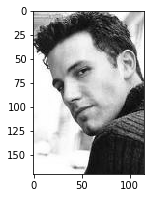

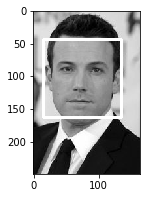

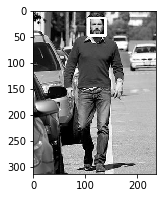

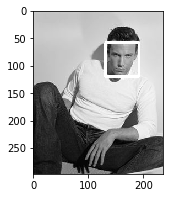

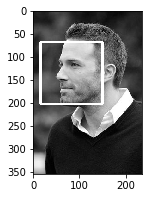

...

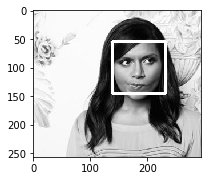

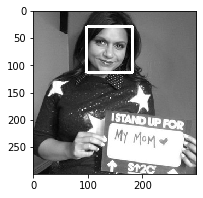

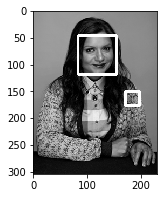

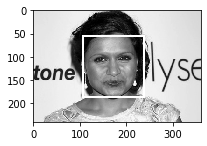

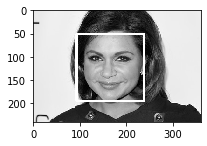

In [4]:
detect_save_faces(train_path, path_haar)

### Observation:-
- In some pics it is able to detect images in some it is not.
- we can chnage the scale factor and try in order to detect faces.
- In some images it is detecting more than one face.
- It is a very good technique but we will use a more advanced CNN technique for face detection.

### 1.4 Using Multitask Cascaded CNN:

In [ ]:
#this program reads the image and creates a new folder of that name detect faces of images and stores in that folder
def extract_faces(train = True, required_size=(160, 160)):
    detector = mtcnn.MTCNN()
    ext_tr_path = 'C:\\Users\\user\\Untitled Folder\\case study - 2\\5-celebrity-faces-dataset\\faces_train'
    ext_test_path = 'C:\\Users\\user\\Untitled Folder\\case study - 2\\5-celebrity-faces-dataset\\faces_val'
    if os.path.isdir(ext_tr_path):
        print('train exists')
    else:
        os.mkdir(ext_tr_path)
    
    if os.path.isdir(ext_test_path):
        print('test exists')
    else:
        os.mkdir(ext_test_path)

    if train == True:
        path = 'C:\\Users\\user\\Untitled Folder\\case study - 2\\5-celebrity-faces-dataset\\train'
        new_dir = ext_tr_path
    else:
        path = 'C:\\Users\\user\\Untitled Folder\\case study - 2\\5-celebrity-faces-dataset\\val'
        new_dir = ext_test_path
    curr_dir = path
    folder_names = os.listdir(path)
    for i in folder_names:
        os.chdir(new_dir)#changing the dir
        if os.path.isdir(new_dir+'\\'+ i):
            continue
        else:
            os.mkdir(i)
        os.chdir(new_dir + '\\' + i)#change dir to keep images in this folder
        for j in os.listdir(path+'\\'+ i):
            pic = cv2.imread(path + '\\'+ i + '\\' + j)
            gray = pic
            pic = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB)
            results = detector.detect_faces(pic) #detect faces in the imnage
            #extract bounding box for first face in the image
            x1, y1, width, height = results[0]['box']
            x1, y1 = abs(x1), abs(y1)
            x2, y2 = x1 + width, y1 + height
            #draw 
            cv2.rectangle(gray, (x1, y1), (x1+width, y1+height), (255, 0, 0), 3)
            cv2.putText(gray, '{:.2f}%'.format((results[0]['confidence'])*100), (x1-10, y1-10),  
                        cv2.FONT_HERSHEY_PLAIN, 1, (0, 255, 0))
            # extract the face '{:.2f}%'.format(confidence*100)
            face = pic[y1:y2, x1:x2]
            #resize the pixel
            face = cv2.resize(face,required_size)
            cv2.imwrite(j, face)
            plt.figure(figsize = (3,3))
            plt.imshow(gray)
        os.chdir(path)


train exists
test exists


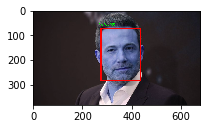

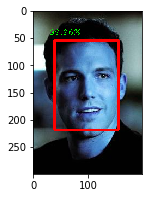

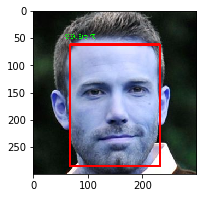

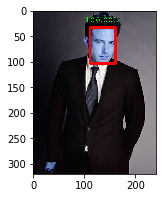

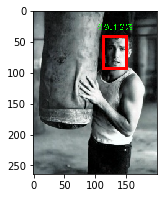

...

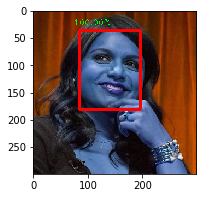

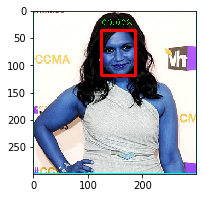

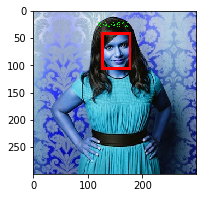

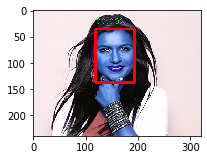

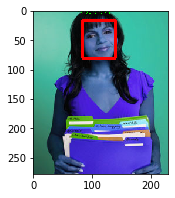

In [ ]:
extract_faces(train = True, required_size=(160,160))
extract_faces(train = False, required_size=(160,160))

### Observation:

- This is doing a much better job of detecting faces

### Module - 2 : Face Recognition System

<H3> 2.1 Using a small Convnet from scratch (Baseline Model)

In [2]:
tr_gen = ImageDataGenerator(rotation_range=20,shear_range= 20,
                            zoom_range= 0.5,horizontal_flip=True,rescale=1. / 255 )

te_gen = ImageDataGenerator(rescale=1. / 255)

tr_dir = '5-celebrity-faces-dataset/faces_train'
test_dir = '5-celebrity-faces-dataset/faces_val'

width = 160
height = 160

In [57]:
### defining model architecture
input_shape = (160,160,3)

model = Sequential()
model.add(Conv2D(24, (3, 3), input_shape=(160,160,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(24, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.1))

model.add(Conv2D(24, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
model.add(Dense(24))
model.add(Dropout(0.1))
model.add(Activation('relu'))
model.add(Dense(5))
model.add(Activation('softmax'))

model.summary()

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_35 (Conv2D)           (None, 158, 158, 24)      672       
_________________________________________________________________
activation_56 (Activation)   (None, 158, 158, 24)      0         
_________________________________________________________________
max_pooling2d_35 (MaxPooling (None, 79, 79, 24)        0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 77, 77, 24)        5208      
_________________________________________________________________
activation_57 (Activation)   (None, 77, 77, 24)        0         
_________________________________________________________________
max_pooling2d_36 (MaxPooling (None, 38, 38, 24)        0         
_________________________________________________________________
dropout_14 (Dropout)         (None, 38, 38, 24)        0         
__________

In [58]:
train_generator = tr_gen.flow_from_directory(directory=tr_dir,
        target_size=(160, 160),
        batch_size= 10,
        class_mode='categorical')
validation_generator = te_gen.flow_from_directory(directory=test_dir,
        target_size=(160, 160),
        batch_size= 10,
        class_mode='categorical')
history = model.fit_generator(
        train_generator,
        steps_per_epoch = 7,
        epochs=50,
        validation_data=validation_generator,
        validation_steps = 3)

Found 70 images belonging to 5 classes.
Found 26 images belonging to 5 classes.
Epoch 1/50
7/7 [==============================] - 5s 725ms/step - loss: 1.6516 - acc: 0.1286 - val_loss: 1.6057 - val_acc: 0.1923
Epoch 2/50
7/7 [==============================] - 3s 422ms/step - loss: 1.6073 - acc: 0.2857 - val_loss: 1.6032 - val_acc: 0.2308
Epoch 3/50
7/7 [==============================] - 3s 408ms/step - loss: 1.6045 - acc: 0.1857 - val_loss: 1.5945 - val_acc: 0.2308
Epoch 4/50
7/7 [==============================] - 3s 377ms/step - loss: 1.5913 - acc: 0.2429 - val_loss: 1.5713 - val_acc: 0.3077
Epoch 5/50
7/7 [==============================] - 6s 863ms/step - loss: 1.5870 - acc: 0.2571 - val_loss: 1.5324 - val_acc: 0.1923
Epoch 6/50
7/7 [==============================] - 3s 436ms/step - loss: 1.5679 - acc: 0.2571 - val_loss: 1.5437 - val_acc: 0.3077
Epoch 7/50
7/7 [==============================] - 3s 402ms/step - loss: 1.5458 - acc: 0.2571 - val_loss: 1.5012 - val_acc: 0.2692
Epoch 8/50

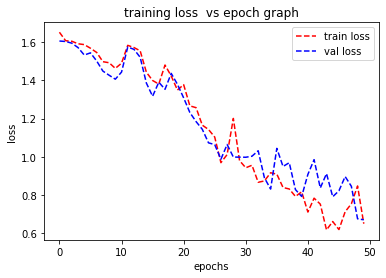

In [59]:
plt.figure()
plt.plot(history.history['loss'], '--r', label = 'train loss')
plt.plot(history.history['val_loss'], '--b', label = 'val loss')
plt.title('training loss  vs epoch graph')
plt.legend()
plt.xlabel('epochs')
plt.ylabel('loss')
plt.show()

In [60]:
print('Achieved a train accuracy of 81.5% , loss = 0.65 and test acc of 74% ,val loss = 0.67  over 50 epochs')
### save model
model.save('small_convnet.h5')

Achieved a train accuracy of 81.5% , loss = 0.65 and test acc of 74% ,val loss = 0.67  over 50 epochs


<H3> 2.2 Transfer Learning (Using Bottleneck features of pretrained VGG16)

In [3]:
model2 = VGG16(weights = 'imagenet', include_top = False, input_shape = (160,160,3))
model2.summary()

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 160, 160, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
bloc

 - We will then run this model on our training and validation data once
 - Then we will train a small fully-connected model on top of the stored features.

### one hot encoding labels

In [7]:
ohe = OneHotEncoder()
tr_y = np.array( [0] *14  + [1] *14 + [2]*14+[3]*14 + [4]*14, ndmin = 2 ).reshape(-1,1)
test_y = np.array([0]*5  + [1] *5 + [2]*5 + [3]*5 + [4]*5, ndmin=2).reshape(-1,1)
tr_labels = ohe.fit_transform(tr_y)
test_labels = ohe.transform(test_y)

### 2.2.1 Using Bottleckneck features and training an mlp on top of it 

In [15]:
top_model_weights_path = 'bottleneck_fc_model.h5'
def save_bottlebeck_features(width = 160, height = 160, 
                             nb_validation_samples = 25,
                             nb_train_samples = 70,
                             batch_size = 5,
                             model = model2, train_data_dir = tr_dir , 
                            validation_data_dir = test_dir):
    tr_gen = ImageDataGenerator(rescale=1. / 255)
    te_gen = ImageDataGenerator(rescale=1. / 255)

    tr_generator = tr_gen.flow_from_directory(
        train_data_dir,
        target_size=(width, height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)
    bottleneck_features_train = model.predict_generator(
        tr_generator ,nb_train_samples//batch_size)
    np.save(open('bottleneck_features_train.npy', 'wb'),
            bottleneck_features_train)

    tr_generator = te_gen.flow_from_directory(
        validation_data_dir,
        target_size=(width, height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)
    bottleneck_features_validation = model.predict_generator(
        tr_generator, nb_validation_samples//batch_size)
    np.save(open('bottleneck_features_validation.npy', 'wb'),
            bottleneck_features_validation)
    
def train_top_model(batch_size = 10, train_labels= tr_labels, validation_labels = test_labels):
    train_data = np.load(open('bottleneck_features_train.npy', 'rb'))

    validation_data = np.load(open('bottleneck_features_validation.npy', 'rb'))
    print(validation_data.shape)

    model = Sequential()
    model.add(Flatten(input_shape=train_data.shape[1:]))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(5, activation='softmax'))
    model.summary()

    model.compile(optimizer='rmsprop',
                  loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(train_data, train_labels,
              epochs=100,
              batch_size=batch_size,
              validation_data=(validation_data, validation_labels))
    model.save(top_model_weights_path)


save_bottlebeck_features()
train_top_model()

Found 70 images belonging to 5 classes.
Found 25 images belonging to 5 classes.
(25, 5, 5, 512)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_8 (Flatten)          (None, 12800)             0         
_________________________________________________________________
dense_22 (Dense)             (None, 32)                409632    
_________________________________________________________________
dropout_15 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_23 (Dense)             (None, 128)               4224      
_________________________________________________________________
dropout_16 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_24 (Dense)             (None, 5)                 645       
Total params: 414,501
Trainable params: 414,50

### Observation:-
- Achieved an accuracy of 95%  on train and 92% on test dataset slight overfitting.
- Showing how powerful the transfer learning models can be.
- There is a high chance that the accuracy will drop when more classes or persons are added to the data.

<h3> 2.3 SIAMESE NETWORK

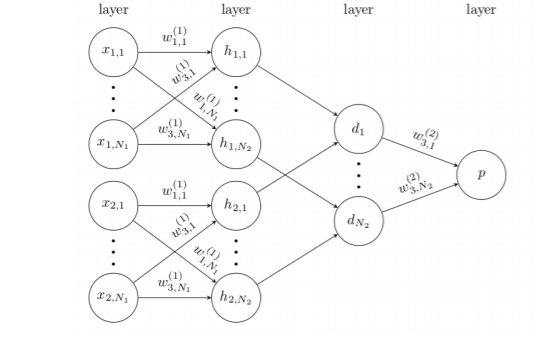

- Machine
learning has been successfully used to achieve state-ofthe-art performance in a variety of applications such as
web search, spam detection, caption generation, and speech
and image recognition. However, these algorithms often
break down when forced to make predictions about data for
which little supervised information is available. We desire
to generalize to these unfamiliar categories without necessitating extensive retraining which may be either expensive
or impossible due to limited data or in an online prediction
setting, such as web retrieval

- A siamese neural network consists of twin networks which accept distinct inputs but are joined by an energy function at the top.
- This function computes some metric between the highestlevel feature representation on each side. The
parameters between the twin networks are tied. 
- Weight tying guarantees that two extremely similar images could not
possibly be mapped by their respective networks to very
different locations in feature space because each network
computes the same function. 
- Also, the network is symmetric, so that whenever we present two distinct images to the twin networks, the top conjoining layer will compute the
same metric as if we were to we present the same two images but to the opposite twins.




### FACENET :



- FaceNet is a Siamese Network

### LOAD THE DATASET :

In [20]:
from mtcnn.mtcnn import MTCNN
#using this to extract single face
def extract_face(filename, required_size = (160,160)):
    im = cv2.imread(filename) #read image
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB ) #default cv2 reads as rgb so convert to bgr 
    detector = MTCNN() #using thsi as detector 
    results = detector.detect_faces(im)
    x1, y1, width, height = results[0]['box'] #consider only single or the first face detected
    x2 = abs(x1) + width
    y2 = abs(y1) + height
    #extract face
    face_array = im[y1:y2, x1:x2] #croping the iface out of image
    face_array = cv2.resize(face_array, required_size) #resizing to required size so as to sned it into facenet model
    return face_array

In [21]:
### load faces from the directory
def load_faces(directory): #this will take the sub dir as input and list the names of the files in it and then add the path to dir to get the full path of image i order to read 
    faces = list()
    #go through each file 
    for filename in os.listdir(directory):
        path = directory + filename
        face = extract_face(path)
        faces.append(face)
    return faces

#load data that contains one subdirectory for each class that contains images
def load_dataset(directory):
    X, y = list(), list()
    for subdir in os.listdir(directory):
        path = directory + subdir + '/'
        # skip any files that might be in the dir
        if not os.path.isdir(path):
            continue
        # load all faces in the subdirectory
        faces = load_faces(path)
        # create labels
        labels = [subdir for i in range(len(faces))]
        # summarize progress
        print('>loaded %d examples for class: %s' % (len(faces), subdir))
        # store
        X.extend(faces)
        y.extend(labels)
    return np.array(X), np.array(y)

### Load train and test data 

In [22]:
#load train and test data
tr_path = '5-celebrity-faces-dataset/train/'
te_path = '5-celebrity-faces-dataset/val/'
trainx, trainy = load_dataset(tr_path)
print('******************************  ')
testx, testy = load_dataset(te_path)

Instructions for updating:
Colocations handled automatically by placer.
>loaded 14 examples for class: ben_afflek
>loaded 14 examples for class: elton_john
>loaded 14 examples for class: jerry_seinfeld
>loaded 14 examples for class: madonna
>loaded 14 examples for class: mindy_kaling
>loaded 6 examples for class: ben_afflek
>loaded 5 examples for class: elton_john
>loaded 5 examples for class: jerry_seinfeld
>loaded 5 examples for class: madonna
>loaded 5 examples for class: mindy_kaling


In [23]:
print(trainx.shape, trainy.shape, testx.shape, testy.shape)
# save arrays to one file in compressed format
savez_compressed('5-celebrity-faces-dataset.npz', trainx, trainy, testx, testy)

(70, 160, 160, 3) (70,) (26, 160, 160, 3) (26,)


### Create Face Embeddings

In [24]:
#loda the pretrained facenet model
facenet = load_model('facenet_keras.h5')

##load the data 
# data = np.load('5-celebrity-faces-dataset.npz')
# trainx, trainy, testx , testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']

def get_embeddings(pixels, model):
    pixels = pixels.astype('float32')
    #standarzie the face piels
    mean, std = pixels.mean(), pixels.std()
    pixels = (pixels - mean) / std
    #single sample create
    samples = np.expand_dims(pixels, axis = 0)
    embd = model.predict(samples)
    return embd[0]

#create train and test embeddings data set    
new_trainx = list()
for facepixels in trainx:
    embeddings = get_embeddings(facepixels, facenet)
    new_trainx.append(embeddings)
new_trainx = np.array(new_trainx)    

new_testx = list()
for facepixels in testx:
    embeddings = get_embeddings(facepixels, facenet)
    new_testx.append(embeddings)
new_testx = np.array(new_testx)

print(new_trainx.shape, new_testx.shape)

#save the arrays in compressed numpy array format
savez_compressed('5-celebrity-faces-embeddings.npz', new_trainx, trainy, new_testx, testy)


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
(70, 128) (26, 128)


In [62]:
### Load the data
embd_data = np.load('5-celebrity-faces-embeddings.npz')
trainx_embd, trainy, testx_embd, testy = embd_data['arr_0'], embd_data['arr_1'], embd_data['arr_2'], embd_data['arr_3']
print(trainx_embd.shape, testx_embd.shape)

(70, 128) (26, 128)


In [67]:
def distance(embeddings1, embeddings2, distance_metric = 0):#function to cal distance between 2 vectors
    if distance_metric == 0:
        'taking euclidean distance :'
        dist = np.linalg.norm(embeddings1 - embeddings2, axis = 0)
    elif distance_metric == 1:
        'taking cosine distance :'
        dot = np.sum(np.multiply(embeddings1, embeddings2))
        denominator = np.multiply(np.linalg.norm(embeddings1), np.linalg.norm(embeddings2) )
        similarity = dot/denominator
        dist = np.arccos(similarity) / math.pi #np.arccos([1, -1]) = array([ 0.        ,  3.14159265])
    return dist

### Train a Classifier on Face Embeddings:

In [29]:
### Train a classifier on the train embedding and test it on test embediing 
svc = SVC(C = 1, kernel = 'linear', probability= True)

# it is a good practise to normalize the vectors since we have to cal the distance between the vectors
norm = Normalizer('l2')
trainx_norm = norm.transform(trainx_embd)
testx_norm = norm.transform(testx_embd)
#label encoder for labels 
le = LabelEncoder()
le.fit(trainy)

#transforming labels
trainy = le.transform(trainy)
testy = le.transform(testy)
print(trainy, testy)
#training modoel
svc.fit(trainx_norm, trainy)
tr_pred = svc.predict(trainx_norm)
tr_pred_proba = svc.predict_proba(trainx_norm)
te_pred = svc.predict(testx_norm)
te_pred_proba = svc.predict_proba(testx_norm)

## accuracy score
tr_acc = accuracy_score(trainy, tr_pred)
te_acc = accuracy_score(testy, te_pred) 
print('Accuracy: train=%.3f, test=%.3f' % (tr_acc*100, te_acc*100))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4] [0 0 0 0 0 0 1 1 1 1 1 2 2 2 2 2 3 3 3 3 3 4 4 4 4 4]
Accuracy: train=100.000, test=100.000


### Testing on a random image from test data

predicted name: madonna, (74.192)
actual name : madonna


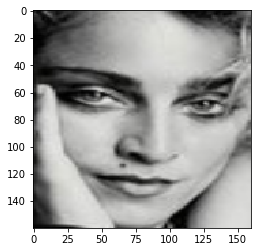

In [61]:
ind = [np.random.choice(testx.shape[0])][0]
actual_class_ind = [testy[ind]]
actual_name = le.inverse_transform(actual_class_ind)
embd = testx_norm[ind]
embd = np.expand_dims(embd, axis = 0)
y_ = svc.predict(embd) #get the class
#get the name from class using inverse ransform
name = le.inverse_transform(y_)[0]
class_ind = y_[0]
y_proba = svc.predict_proba(embd)
class_prob = y_proba[0, class_ind]*100

print('predicted name: %s, (%.3f)' % (name, class_prob))
print('actual name : %s' % (actual_name[0]) )

plt.imshow(testx[ind])

### Final Prediction Using Webcam:

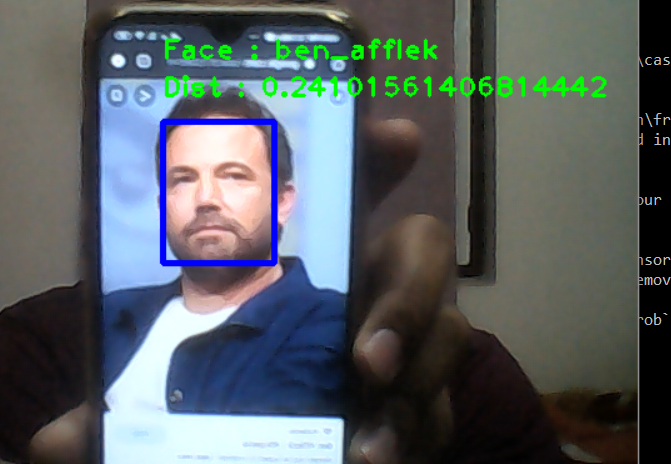

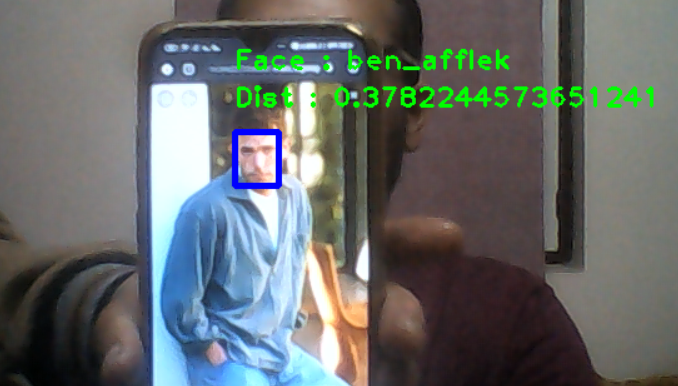